In [1]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


IMPORT NECESSARY LIBRARIES

In [14]:

import pandas as pd
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import re
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms as transforms
import seaborn as sns
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler,RobustScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
from sklearn.feature_selection import mutual_info_classif



In [15]:

captions = pd.read_table('/content/drive/MyDrive/ROCO/data/train/radiology/captions.txt',header=None,names = ['image_id','caption'])
captions


,image_id,caption
0,ROCO_00002,Computed tomography scan in axial view showin...
1,ROCO_00003,Bacterial contamination occurred after comple...
2,ROCO_00004,The patient had residual paralysis of the han...
3,ROCO_00005,Panoramic radiograph after immediate loading.
4,ROCO_00007,Plain abdomen x-ray: Multiple air levels at t...
...,...,...
65445,ROCO_81819,Initial CT abdomen with contrast showing a di...
65446,ROCO_81820,44-year-old male patient after surgical amput...
65447,ROCO_81821,Primary pulmonary tuberculosis in 18-year-old...
65448,ROCO_81822,"MRI brain with gadolinium, coronal view, show..."


**EXPLORATORY DATA ANALYSIS**

In [16]:
# 1. Basic Information
print("\n# Dataset Overview")
print("Shape of the dataset:", captions.shape)
print("First 5 rows:\n", captions.head())
print("Columns:\n", captions.columns)
print("Data Types:\n", captions.dtypes)


# Dataset Overview
Shape of the dataset: (65450, 2)
First 5 rows:
      image_id                                            caption
0  ROCO_00002   Computed tomography scan in axial view showin...
1  ROCO_00003   Bacterial contamination occurred after comple...
2  ROCO_00004   The patient had residual paralysis of the han...
3  ROCO_00005      Panoramic radiograph after immediate loading.
4  ROCO_00007   Plain abdomen x-ray: Multiple air levels at t...
Columns:
 Index(['image_id', 'caption'], dtype='object')
Data Types:
 image_id    object
caption     object
dtype: object


In [17]:
# 2. Handling Missing Values
print("\n# Missing Values")
print(captions.isnull().sum())


# Missing Values
image_id    0
caption     0
dtype: int64


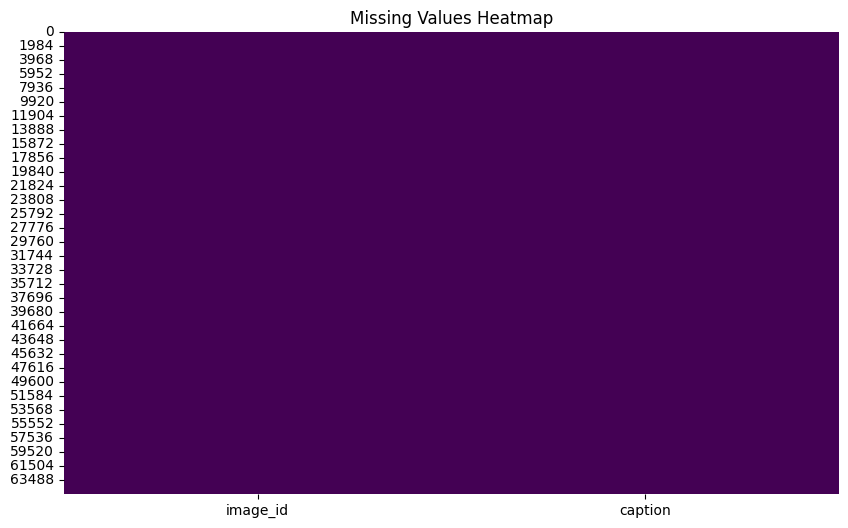

In [18]:
# Visualizing Missing Data
plt.figure(figsize=(10, 6))
sns.heatmap(captions.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [19]:
# 3. Descriptive Statistics
print("\n# Summary Statistics")
print(captions.describe())



# Summary Statistics
          image_id                         caption
count        65450                           65450
unique       65450                           64772
top     ROCO_81823   Initial panoramic radiograph.
freq             1                              19


In [20]:
captions['caption'].describe()

,caption
count,65450
unique,64772
top,Initial panoramic radiograph.
freq,19


In [21]:
captions['caption'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 65450 entries, 0 to 65449
Series name: caption
Non-Null Count  Dtype 
--------------  ----- 
65450 non-null  object
dtypes: object(1)
memory usage: 511.5+ KB


In [22]:
captions['caption'].tail(10)


,caption
65440,Coronal CT image demonstrates the duodenum co...
65441,Spino-iliac angle (SIA): lines were drawn alo...
65442,Hinchey stage III. Intravenous and rectal con...
65443,Decompression tube is inserted followed by th...
65444,Doppler ultrasound revealed extensive thrombo...
65445,Initial CT abdomen with contrast showing a di...
65446,44-year-old male patient after surgical amput...
65447,Primary pulmonary tuberculosis in 18-year-old...
65448,"MRI brain with gadolinium, coronal view, show..."
65449,Contrast-enhanced 3D MRL image of the lower e...


In [23]:
captions['caption'].value_counts()

,count
caption,
Initial panoramic radiograph.,19
Preoperative radiograph,15
Postoperative radiograph,13
Chest X-ray,11
Final panoramic radiograph.,11
...,...
Computed tomography scan at the level of the lateral ventricles. There is a thin layer of acute subdural hematoma identified on the left with a minimal midline shift (arrow). A = anterior; P = posterior; L = left; R = right.,1
Magnetic resonance imaging of the mass,1
"Computed tomography image of the abdominal aorta.In Roman numerals the infra renal distances are portrayed. I: 0 mm, II: 7.5 mm, and III: 15 mm. To provide a standardized method for measuring the distances as mentioned above, first the midline of the aortic neck is chosen. The perpendicular line is then placed at the point where the lowest renal artery branches from the aorta. In the caudal direction from this point (I) and parallel to the midline, a distance of 7.5 and of 15 mm is measured to identify point II and III, respectively.",1


In [24]:
captions['caption'].nunique()

64772

In [25]:
print(captions.drop_duplicates(inplace=True))

None


In [26]:
# 3. Statistical Insights on Captions (Length)
caption_lengths = captions['caption'].apply(len)
print("Caption Length - Mean:", caption_lengths.mean())
print("Caption Length - Median:", caption_lengths.median())
print("Caption Length - Std Dev:", caption_lengths.std())



Caption Length - Mean: 138.96345301757066
Caption Length - Median: 114.0
Caption Length - Std Dev: 104.23794327332219


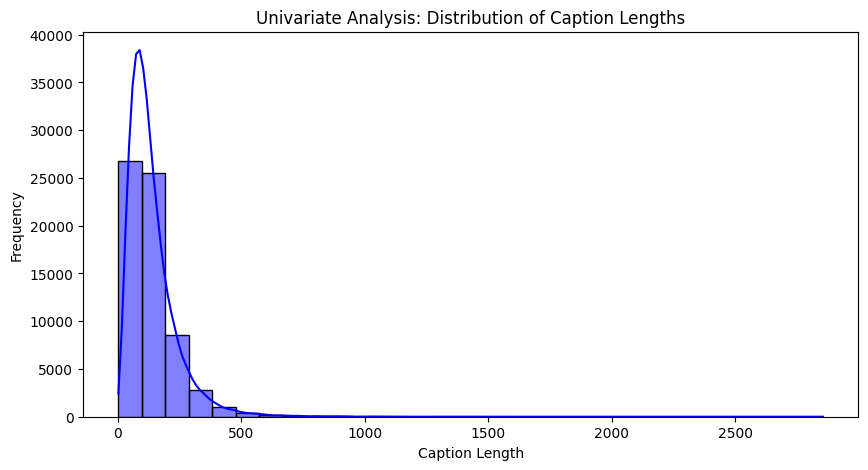

Caption Length - Skewness: 3.591388917815334
Caption Length - Kurtosis: 36.45302896343286


In [27]:
# 1. Univariate Analysis
# Numerical Variables
plt.figure(figsize=(10, 5))
sns.histplot(caption_lengths, kde=True, bins=30, color='blue')
plt.title('Univariate Analysis: Distribution of Caption Lengths')
plt.xlabel('Caption Length')
plt.ylabel('Frequency')
plt.show()

# Statistical Summary
print("Caption Length - Skewness:", skew(caption_lengths))
print("Caption Length - Kurtosis:", kurtosis(caption_lengths))

# Categorical Variables (if any)
# Example: Assuming 'category' column exists in captions DataFrame
if 'category' in captions.columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(x='category', data=captions, palette='Set2')
    plt.title('Univariate Analysis: Category Distribution')
    plt.xticks(rotation=45)
    plt.show()




# Text Data Analysis


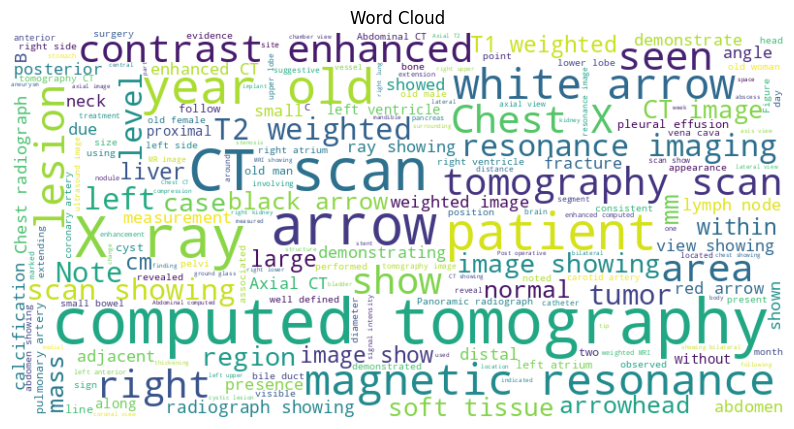

In [28]:
if 'caption' in captions.columns:  # Replace 'text_column' with your text column name
    print("\n# Text Data Analysis")
    # Word Frequency
    text_data = captions['caption'].dropna()
    vectorizer = CountVectorizer(stop_words='english')
    word_counts = vectorizer.fit_transform(text_data)
    word_counts_sum = word_counts.sum(axis=0)
    words = vectorizer.get_feature_names_out()
    word_freq = [(word, word_counts_sum[0, idx]) for word, idx in zip(words, range(len(words)))]
    word_freq = sorted(word_freq, key=lambda x: x[1], reverse=True)

    # Word Cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(text_data))
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Word Cloud")
    plt.show()

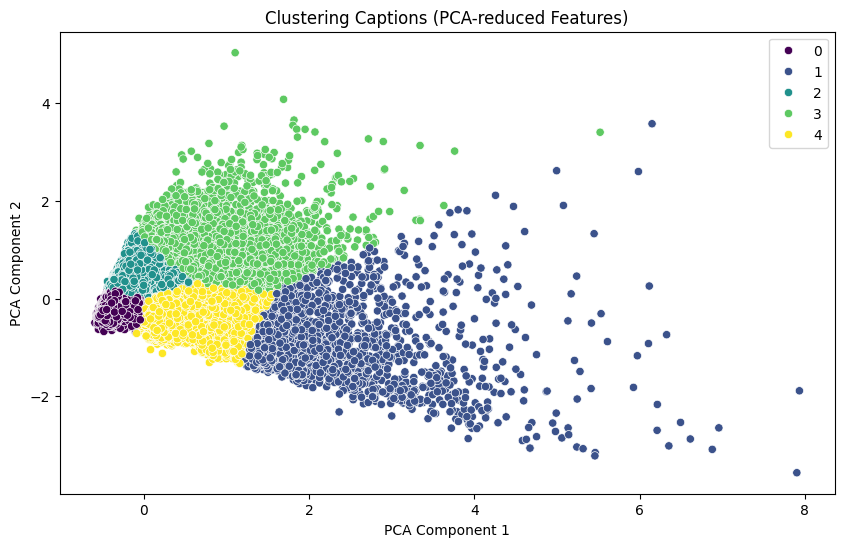

In [29]:
#Clustering Captions
# Use CountVectorizer to convert text to features
vectorizer = CountVectorizer(max_features=1000, stop_words='english')
caption_features = vectorizer.fit_transform(captions['caption'])
#countvectorizer to convert text to features
vectorizer = CountVectorizer(max_features=1000, stop_words='english')
caption_features = vectorizer.fit_transform(captions['caption'])

# PCA to reduce dimensionality
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(caption_features.toarray())

# KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(reduced_features)

# Plot clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=clusters, palette='viridis')
plt.title('Clustering Captions (PCA-reduced Features)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()



In [32]:
df['caption_length']=df['caption'].str.len()


In [31]:

base_dir = '/content/drive/MyDrive/ROCO/data/'
splits = ['train', 'test', 'validation']
categories = ['radiology', 'non-radiology']

data = []
for split in splits:
    for category in categories:
        category_dir = os.path.join(base_dir, split, category)
        captions_file = os.path.join(category_dir, 'captions.txt')

        if os.path.exists(captions_file):
            with open(captions_file, 'r', encoding='utf-8', errors='ignore') as file:
                for line in file:
                    image_id = line[:12]
                    caption = line[12:].strip()
                    label = category
                    data.append([image_id, caption, label, split])

df = pd.DataFrame(data, columns=['image_id', 'caption', 'label', 'split'])
df

,image_id,caption,label,split
0,ROCO_00002\t,Computed tomography scan in axial view showing...,radiology,train
1,ROCO_00003\t,Bacterial contamination occurred after complet...,radiology,train
2,ROCO_00004\t,The patient had residual paralysis of the hand...,radiology,train
3,ROCO_00005\t,Panoramic radiograph after immediate loading.,radiology,train
4,ROCO_00007\t,Plain abdomen x-ray: Multiple air levels at th...,radiology,train
...,...,...,...,...
87922,ROCO_87894\t,Scanning electron photomicrograph of blood cel...,non-radiology,validation
87923,ROCO_87904\t,SEM of Solenopsis elhawagryi sp. n. minor work...,non-radiology,validation
87924,ROCO_87918\t,Under visualization through the anterolateral ...,non-radiology,validation
87925,ROCO_87936\t,The endoscopic view demonstrated progressive d...,non-radiology,validation


In [33]:
import os
import re

# Example parameters
base_path = '/content/drive/MyDrive/ROCO/data/'
data_splits = ['train', 'test', 'validation']
subfolders = ['radiology', 'non-radiology']
sample_size_per_category = 10  # Adjust as needed

data = []

for split in data_splits:
    for subfolder in subfolders:
        caption_file = os.path.join(base_path, split, subfolder, 'captions.txt')
        image_folder = os.path.join(base_path, split, subfolder, 'images')

        # Read a subset of captions
        with open(caption_file, 'r', encoding='utf-8', errors='ignore') as file:
            for i, line in enumerate(file):
                if i >= sample_size_per_category:
                    break

                # Match and extract image_id and caption
                match = re.match(r"^(\S+)\s+(.*)$", line.strip())
                if match:
                    image_id = match.group(1)
                    caption = match.group(2)
                    image_path = os.path.join(image_folder, f"{image_id}.jpg")

                    # Append to data list
                    data.append({
                        'image_id': image_id,
                        'caption': caption,
                        'label': subfolder,
                        'split': split,
                        'image_path': image_path
                    })

In [34]:
sample_df = pd.DataFrame(data)
sample_df.head(5)

,image_id,caption,label,split,image_path
0,ROCO_00002,Computed tomography scan in axial view showing...,radiology,train,/content/drive/MyDrive/ROCO/data/train/radiolo...
1,ROCO_00003,Bacterial contamination occurred after complet...,radiology,train,/content/drive/MyDrive/ROCO/data/train/radiolo...
2,ROCO_00004,The patient had residual paralysis of the hand...,radiology,train,/content/drive/MyDrive/ROCO/data/train/radiolo...
3,ROCO_00005,Panoramic radiograph after immediate loading.,radiology,train,/content/drive/MyDrive/ROCO/data/train/radiolo...
4,ROCO_00007,Plain abdomen x-ray: Multiple air levels at th...,radiology,train,/content/drive/MyDrive/ROCO/data/train/radiolo...


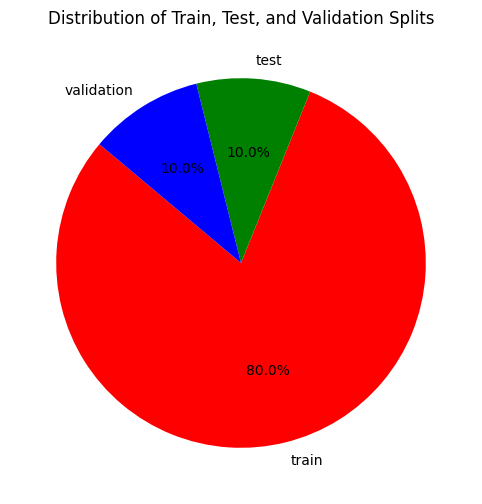

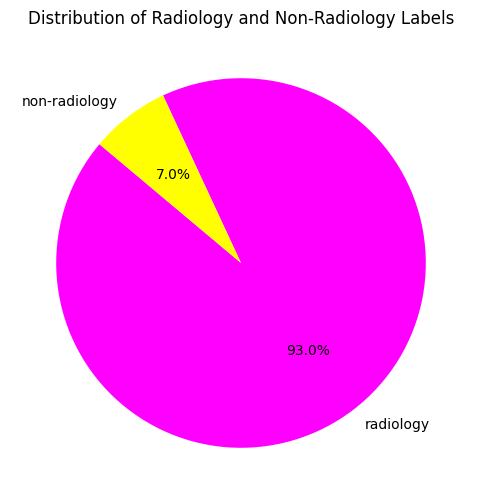

In [35]:
import matplotlib.pyplot as plt

split_counts = df['split'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(split_counts, labels=split_counts.index, autopct='%1.1f%%', startangle=140, colors=['red', 'green', 'blue'])
plt.title("Distribution of Train, Test, and Validation Splits")
plt.show()

label_counts = df['label'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140, colors=['magenta', 'yellow'])
plt.title("Distribution of Radiology and Non-Radiology Labels")
plt.show()


# Image Data Analysis 
Number of images: 48077


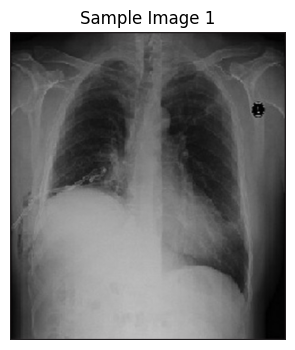

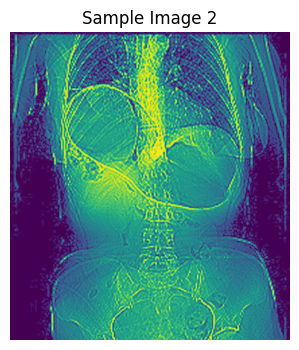

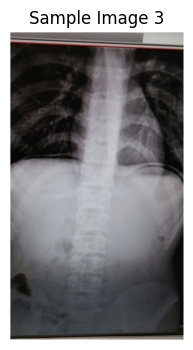

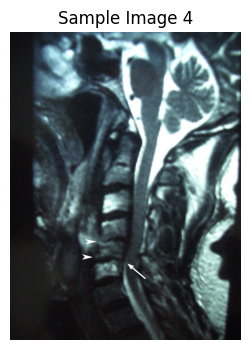

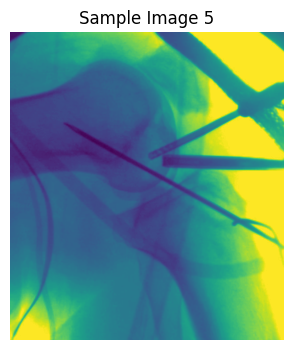

In [36]:
image_folder = '/content/drive/MyDrive/ROCO/data/train/radiology/images'
if os.path.exists(image_folder):
    print("\n# Image Data Analysis ")
    image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Number of images: {len(image_files)}")

    # Display Sample Images
    for i, image_file in enumerate(image_files[:5]):
        img = Image.open(image_file)
        plt.figure(figsize=(4, 4))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Sample Image {i+1}")
        plt.show()





Displaying a batch from train_loader:


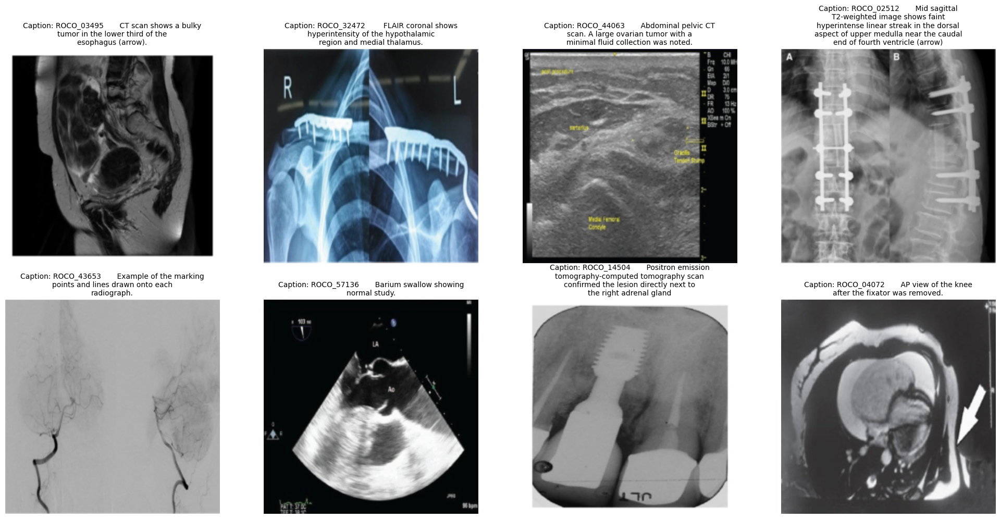

In [45]:
#display images along with captions
import os
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import textwrap

# Define a custom dataset for ROCO
class RocoDataset(Dataset):
    def __init__(self, image_dir, caption_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Load captions from a text file
        with open(caption_file, 'r') as f:
            self.captions = f.readlines()

        # Assuming captions and image filenames are in the same order
        self.image_filenames = sorted(os.listdir(image_dir))  # Ensure correct order

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        # Load the image
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        image = Image.open(img_path).convert('RGB')

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        # Get the caption (strip any trailing newlines or spaces)
        caption = self.captions[idx].strip()
        return image, caption

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224 for uniformity
    transforms.ToTensor(),         # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Initialize the dataset and dataloader
image_dir = '/content/drive/MyDrive/ROCO/data/train/radiology/images'
caption_file = '/content/drive/MyDrive/ROCO/data/train/radiology/captions.txt'
roco_dataset = RocoDataset(image_dir, caption_file, transform=transform)
train_loader = DataLoader(roco_dataset, batch_size=8, shuffle=True)

# Denormalize images for visualization
def denormalize_image(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor = tensor * std[:, None, None] + mean[:, None, None]
    return tensor.permute(1, 2, 0).clamp(0, 1).numpy()

# Visualize a batch of images
def show_batch_images(data_loader):
    data_iter = iter(data_loader)
    images, captions = next(data_iter)

    num_images = images.shape[0]
    cols = 4
    rows = (num_images // cols) + (num_images % cols > 0)

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, rows * 5))
    axes = axes.flatten()

    for i in range(num_images):
        image = denormalize_image(images[i])
        axes[i].imshow(image)
        wrapped_caption = textwrap.fill(captions[i], width=40)
        axes[i].set_title(f"Caption: {wrapped_caption}", fontsize=10)
        axes[i].axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Display a batch of images
print("Displaying a batch from train_loader:")
show_batch_images(train_loader)


**VGG16 FEATURE MAP EXTRACTION**

In [37]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

In [38]:
base_model=VGG16(weights="imagenet")


553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 24s 0us/step


In [39]:
from tensorflow.keras.preprocessing import image
model=Model(inputs=base_model.input,outputs=base_model.get_layer("block5_conv3").output)

In [40]:
def load_and_preprocess_image(img_path,target_size=(224,224)):
  img=image.load_img('/content/drive/MyDrive/ROCO/data/train/radiology/images/ROCO_81808.jpg',target_size=target_size)
  img_array=image.img_to_array(img)
  img_array=np.expand_dims(img_array,axis=0)
  img_array=preprocess_input(img_array)
  return img_array

In [41]:
img=image.load_img('/content/drive/MyDrive/ROCO/data/train/radiology/images/ROCO_81808.jpg',target_size=(224,224))
img_array=image.img_to_array(img)

In [42]:
img_array.shape


(224, 224, 3)

In [43]:
img_array=np.expand_dims(img_array,axis=0)
img_array.shape

(1, 224, 224, 3)

In [44]:
feature_maps=model.predict(img_array)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


In [45]:
n_features=feature_maps.shape[-1]
n_features

512

In [46]:
size=feature_maps.shape[1]
from PIL import Image


In [47]:
img_path='/content/drive/MyDrive/ROCO/data/train/radiology/images/ROCO_81808.jpg'
img=Image.open(img_path)
img.size

(406, 468)

In [48]:
display_grid=np.zeros((size,size*n_features))
display_grid

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [49]:
for i in range(n_features):
  x=feature_maps[0,:,:,i]
  x-=x.mean()
  x/=(x.std()+1e-5)
  x*=64
  x+=128
  x=np.clip(x,0,255).astype(int)
  display_grid[:,i*size:(i+1)*size]=x

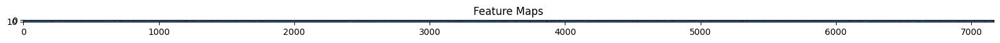

In [50]:
scale=20./n_features
plt.figure(figsize=(scale*n_features,scale))
plt.title("Feature Maps")
plt.grid(False)
plt.imshow(display_grid,aspect="auto")

Feature map shape: (1, 14, 14, 512)


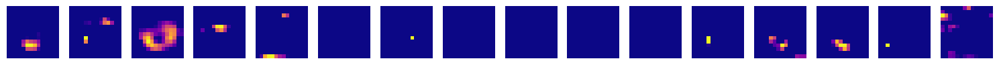

In [51]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

def plot_feature_maps(feature_maps, num_channels=16, figsize=(20, 20), colormap='viridis'):
    channels = feature_maps.shape[-1]
    num_channels = min(num_channels, channels)
    fig, axes = plt.subplots(1, num_channels, figsize=figsize)
    for i in range(num_channels):
        ax = axes[i]
        ax.imshow(feature_maps[0, :, :, i], cmap=colormap)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

print(f"Feature map shape: {feature_maps.shape}")
plot_feature_maps(feature_maps, num_channels=16, figsize=(15, 10), colormap='plasma')

**ANN**

In [52]:
df

,image_id,caption,label,split,caption_length
0,ROCO_00002\t,Computed tomography scan in axial view showing...,radiology,train,87
1,ROCO_00003\t,Bacterial contamination occurred after complet...,radiology,train,141
2,ROCO_00004\t,The patient had residual paralysis of the hand...,radiology,train,319
3,ROCO_00005\t,Panoramic radiograph after immediate loading.,radiology,train,45
4,ROCO_00007\t,Plain abdomen x-ray: Multiple air levels at th...,radiology,train,123
...,...,...,...,...,...
87922,ROCO_87894\t,Scanning electron photomicrograph of blood cel...,non-radiology,validation,111
87923,ROCO_87904\t,SEM of Solenopsis elhawagryi sp. n. minor work...,non-radiology,validation,73
87924,ROCO_87918\t,Under visualization through the anterolateral ...,non-radiology,validation,303
87925,ROCO_87936\t,The endoscopic view demonstrated progressive d...,non-radiology,validation,84


In [53]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf=TfidfVectorizer(max_features=1000)
X=tfidf.fit_transform(df['caption']).toarray()
y=df['label']
X
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

In [54]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

In [55]:
# Split into Train, Validation, and Test Sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define Model
model = Sequential([
    Dense(64, activation='relu', kernel_regularizer=l2(0.01), input_shape=(X.shape[1],)),
    Dropout(0.5),
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [56]:
# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss=BinaryCrossentropy(),
              metrics=['accuracy', 'Precision', 'Recall', 'AUC'])



In [57]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))


Epoch 1/10
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 15s 5ms/step - AUC: 0.5381 - Precision: 0.9315 - Recall: 0.9827 - accuracy: 0.9164 - loss: 0.4745 - val_AUC: 0.6197 - val_Precision: 0.9305 - val_Recall: 1.0000 - val_accuracy: 0.9305 - val_loss: 0.2538
Epoch 2/10
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - AUC: 0.5063 - Precision: 0.9310 - Recall: 1.0000 - accuracy: 0.9310 - loss: 0.2582 - val_AUC: 0.5000 - val_Precision: 0.9305 - val_Recall: 1.0000 - val_accuracy: 0.9305 - val_loss: 0.2534
Epoch 3/10
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - AUC: 0.4983 - Precision: 0.9300 - Recall: 1.0000 - accuracy: 0.9300 - loss: 0.2599 - val_AUC: 0.5000 - val_Precision: 0.9305 - val_Recall: 1.0000 - val_accuracy: 0.9305 - val_loss: 0.2529
Epoch 4/10
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - AUC: 0.5089 - Precision: 0.9297 - Recall: 1.0000 - accuracy: 0.9297 - loss: 0.2587 - val_AUC: 0.5000 - val_Precision: 0.9305 - val_Recall: 1.0000 - val_accuracy: 0.9305 - val_loss: 0.2531
Epoch 5/10
1924/1924 ━━

In [58]:
loss, accuracy, precision, recall, auc = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {auc:.4f}")

# Classification Report
target_names = ['non-radiology', 'radiology']  # Replace with your actual class names if different
y_pred = (model.predict(X_test) > 0.5).astype("int32").flatten()  # Ensure it's a 1D array
print(classification_report(y_test, y_pred, target_names=target_names))

413/413 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5000 - Precision: 0.9326 - Recall: 1.0000 - accuracy: 0.9326 - loss: 0.2470
Test Loss: 0.2526, Accuracy: 0.9304, Precision: 0.9304, Recall: 1.0000, AUC: 0.5000
413/413 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
               precision    recall  f1-score   support

non-radiology       0.00      0.00      0.00       918
    radiology       0.93      1.00      0.96     12272

     accuracy                           0.93     13190
    macro avg       0.47      0.50      0.48     13190
 weighted avg       0.87      0.93      0.90     13190



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [59]:
loss*100,accuracy*100
model.predict(X)
# ROC-AUC Score
roc_auc = roc_auc_score(y_test, model.predict(X_test))
print(f"ROC-AUC Score: {roc_auc:.4f}")

2748/2748 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
413/413 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
ROC-AUC Score: 0.5000


**LSTM TEXT GENERATION**

In [60]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Embedding, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.models import Model

In [61]:
file_path = '/content/drive/MyDrive/ROCO/data/train/radiology/captions.txt'
with open(file_path, 'r') as file:
    captions = file.readlines()

In [62]:
corpus = [caption.strip() for caption in captions[:300] if caption.strip()]
tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

Vocabulary size: 2187


In [63]:
# Create sequences from the corpus
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

In [64]:
# Find the maximum sequence length
max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

In [65]:
X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

In [66]:
# Function to build the model with hyperparameters
def build_model(embedding_dim=50, lstm_units=100, dropout_rate=0.2, optimizer='adam', learning_rate=0.001):
    # Select optimizer with specified learning rate
    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    # Build the model
    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len-1),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=selected_optimizer, metrics=['accuracy'])
    return model

In [70]:

# Define hyperparameters
hyperparameters = {
    "embedding_dim": 100,  # Dimension of embedding vector
    "lstm_units": 128,     # Number of LSTM units
    "dropout_rate": 0.3,   # Dropout rate
    "optimizer": 'adam',   # Optimizer type ('adam' or 'rmsprop')
    "learning_rate": 0.001 # Learning rate
}

In [71]:
# Build model function
def build_model(embedding_dim, lstm_units, dropout_rate, optimizer, learning_rate):
    # Input layer
    inputs = Input(shape=(None,), name="input_layer")

    # Embedding layer
    x = Embedding(input_dim=5000, output_dim=embedding_dim, name="embedding_layer")(inputs)

    # Bidirectional LSTM
    x = Bidirectional(LSTM(units=lstm_units, return_sequences=False, dropout=dropout_rate), name="bi_lstm")(x)

    # Batch Normalization
    x = BatchNormalization(name="batch_norm")(x)

    # Dense layer
    x = Dense(units=128, activation='relu', name="dense_layer")(x)

    # Dropout layer
    x = Dropout(rate=dropout_rate, name="dropout_layer")(x)


    # Multi-class output layer
    outputs = Dense(units=2187, activation='softmax', name="output_layer")(x)


    # Model definition
    model = Model(inputs=inputs, outputs=outputs, name="improved_lstm_model")

    # Optimizer with gradient clipping
    optimizer = Adam(learning_rate=learning_rate, clipnorm=1.0)

    # Compile model

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


    return model

# Build the updated model
model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)

# Model summary
model.summary()

Model: "improved_lstm_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ embedding_layer (Embedding)          │ (None, None, 100)           │         500,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bi_lstm (Bidirectional)              │ (None, 256)                 │         234,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm (BatchNormalization)      │ (None, 256)                 │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_layer (Dense)                  │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_layer (Dropout)              │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 2187)                │         282,123 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,050,539 (4.01 MB)

 Trainable params: 1,050,027 (4.01 MB)

 Non-trainable params: 512 (2.00 KB)

In [72]:
# Train the model and capture the history
print("\nTraining Model:")
history = model.fit(X, y, epochs=100, verbose=1, batch_size=32)


Training Model:
Epoch 1/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.0549 - loss: 7.1444
Epoch 2/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.0821 - loss: 6.1544
Epoch 3/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.1060 - loss: 5.7823
Epoch 4/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1375 - loss: 5.4124
Epoch 5/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.1696 - loss: 5.0439
Epoch 6/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.2007 - loss: 4.6861
Epoch 7/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.2289 - loss: 4.3668
Epoch 8/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.2699 - loss: 4.0598
Epoch 9/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2948 - loss: 3.7239
Epoch 10/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.3447 - loss: 3.4118
Epoch 11/100
199/199 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.3804 - loss: 3.0738
Epoch 12/100


In [73]:
final_accuracy = history.history['accuracy'][-1]  # Get the final accuracy from the history
print(f"\ Accuracy : {final_accuracy*100}")

\ Accuracy : 87.90360689163208


**Classification report of LSTM**


In [74]:
from sklearn.metrics import classification_report
import numpy as np

# Predict the classes for the training data
y_pred = np.argmax(model.predict(X), axis=-1)  # Convert softmax probabilities to class indices
y_true = np.argmax(y, axis=-1)  # Convert one-hot encoded true labels to class indices

# Get the unique class labels from y_true
labels = np.unique(y_true)

# Filter target_names to match the labels
target_names = [tokenizer.index_word.get(label, str(label)) for label in labels]


# Generate the classification report using the filtered target_names and labels
report = classification_report(y_true, y_pred, labels=labels, target_names=target_names)
print("\nClassification Report:\n")
print(report)

199/199 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step

Classification Report:

                     precision    recall  f1-score   support

                the       1.00      1.00      1.00       397
                 of       0.97      1.00      0.99       276
                and       0.99      0.99      0.99       128
                  a       0.99      0.99      0.99       123
               with       0.98      0.97      0.98       119
                 in       0.98      1.00      0.99       116
            showing       0.97      0.99      0.98        91
              right       1.00      0.97      0.98        66
              arrow       1.00      1.00      1.00        55
                 ct       1.00      0.98      0.99        53
               left       0.95      1.00      0.97        52
              image       1.00      0.98      0.99        47
                 to       0.98      1.00      0.99        44
              shows       1.00      0.98      0.99        41
               sc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


**HYPERPARAMETER TUNING**

**Randomized Search**




In [76]:
from sklearn.model_selection import ParameterSampler
from tensorflow.keras.callbacks import EarlyStopping
import random
import numpy as np

# Define the hyperparameter space
param_space = {
    "embedding_dim": [50, 100, 150],
    "lstm_units": [64, 128, 256],
    "dropout_rate": [0.2, 0.3, 0.5],
    "optimizer": ['adam', 'rmsprop'],
    "learning_rate": [0.001, 0.005, 0.01]
}

# Randomized search
n_iter = 10  # Number of random combinations to try
param_combinations = list(ParameterSampler(param_space, n_iter=n_iter, random_state=42))

# Splitting data into training and validation
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize tracking variables
best_accuracy = 0
best_params = None
best_model = None

# Run experiments
for idx, params in enumerate(param_combinations):
    print(f"\n[{idx + 1}/{n_iter}] Testing combination: {params}")

    # Build model
    model = build_model(
        embedding_dim=params['embedding_dim'],
        lstm_units=params['lstm_units'],
        dropout_rate=params['dropout_rate'],
        optimizer=params['optimizer'],
        learning_rate=params['learning_rate']
    )

    # Define early stopping
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=1)

    # Train the model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=20,  # Train for more epochs with early stopping
        batch_size=32,
        callbacks=[early_stopping],
        verbose=0  # Suppress detailed logs for brevity
    )

    # Get the best validation accuracy
    val_accuracy = max(history.history['val_accuracy'])
    print(f"Validation Accuracy: {val_accuracy:.4f}")

    # Update best model if current one is better
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = params
        best_model = model

print("\n--- Randomized Search Results ---")
print(f"Best Parameters: {best_params}")
print(f"Best Validation Accuracy: {best_accuracy:.4f}")

# Save the best model
best_model.save("best_model.h5")
print("\nBest model saved as 'best_model.h5'.")



[1/10] Testing combination: {'optimizer': 'adam', 'lstm_units': 128, 'learning_rate': 0.01, 'embedding_dim': 150, 'dropout_rate': 0.5}
Epoch 9: early stopping
Restoring model weights from the end of the best epoch: 6.
Validation Accuracy: 0.0969

[2/10] Testing combination: {'optimizer': 'rmsprop', 'lstm_units': 64, 'learning_rate': 0.001, 'embedding_dim': 50, 'dropout_rate': 0.5}
Epoch 17: early stopping
Restoring model weights from the end of the best epoch: 14.
Validation Accuracy: 0.1260

[3/10] Testing combination: {'optimizer': 'rmsprop', 'lstm_units': 256, 'learning_rate': 0.001, 'embedding_dim': 100, 'dropout_rate': 0.5}
Epoch 15: early stopping
Restoring model weights from the end of the best epoch: 12.
Validation Accuracy: 0.1220

[4/10] Testing combination: {'optimizer': 'rmsprop', 'lstm_units': 64, 'learning_rate': 0.001, 'embedding_dim': 50, 'dropout_rate': 0.3}
Epoch 14: early stopping
Restoring model weights from the end of the best epoch: 11.
Validation Accuracy: 0.122

Validation Accuracy: 0.1331

--- Randomized Search Results ---
Best Parameters: {'optimizer': 'adam', 'lstm_units': 64, 'learning_rate': 0.001, 'embedding_dim': 150, 'dropout_rate': 0.5}
Best Validation Accuracy: 0.1331

Best model saved as 'best_model.h5'.


**Hyperopt**

In [77]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
from sklearn.model_selection import train_test_split

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the objective function
def objective(params):
    print(f"Testing combination: {params}")

    # Build model with dynamic parameter casting
    model = build_model(
        embedding_dim=int(params['embedding_dim']),
        lstm_units=int(params['lstm_units']),
        dropout_rate=params['dropout_rate'],
        optimizer=params['optimizer'],
        learning_rate=params['learning_rate']
    )

    # Define early stopping
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=0)

    # Train the model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=20,  # More epochs with early stopping
        batch_size=32,
        callbacks=[early_stopping],
        verbose=0  # Suppress detailed training logs
    )

    # Get the best validation accuracy
    val_accuracy = max(history.history['val_accuracy'])
    print(f"Validation Accuracy: {val_accuracy:.4f}")

    # Return the negative of validation accuracy as loss for Hyperopt
    return {'loss': -val_accuracy, 'status': STATUS_OK}

# Define the search space
space = {
    'embedding_dim': hp.choice('embedding_dim', [50, 100, 150]),
    'lstm_units': hp.choice('lstm_units', [64, 128, 256]),
    'dropout_rate': hp.uniform('dropout_rate', 0.2, 0.5),
    'optimizer': hp.choice('optimizer', ['adam', 'rmsprop']),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.01))
}

# Run Hyperopt
trials = Trials()
best = fmin(objective, space, algo=tpe.suggest, max_evals=20, trials=trials)

print("\n--- Hyperopt Results ---")
print(f"Best Parameters: {best}")

# Map integer indices to actual parameter values for categorical choices
best_params = {
    'embedding_dim': [50, 100, 150][best['embedding_dim']],
    'lstm_units': [64, 128, 256][best['lstm_units']],
    'dropout_rate': best['dropout_rate'],
    'optimizer': ['adam', 'rmsprop'][best['optimizer']],
    'learning_rate': best['learning_rate']
}
print(f"Best Parameters (Decoded): {best_params}")


print("\nTrials Summary:")
for trial in trials.trials[:5]:  # Print the first 5 trials for brevity
    print(f"Trial {trial['tid']}: Loss={trial['result']['loss']}, Params={trial['misc']['vals']}")


Testing combination: {'dropout_rate': 0.44635077156922653, 'embedding_dim': 150, 'learning_rate': 0.0018461019701125037, 'lstm_units': 256, 'optimizer': 'adam'}
Validation Accuracy: 0.1126
Testing combination: {'dropout_rate': 0.2276798510703436, 'embedding_dim': 100, 'learning_rate': 0.0017791828242584929, 'lstm_units': 128, 'optimizer': 'adam'}
Validation Accuracy: 0.1220
Testing combination: {'dropout_rate': 0.3776492234203012, 'embedding_dim': 50, 'learning_rate': 0.0022370945359059305, 'lstm_units': 64, 'optimizer': 'rmsprop'}
Validation Accuracy: 0.1425
Testing combination: {'dropout_rate': 0.2726757752818421, 'embedding_dim': 50, 'learning_rate': 0.0033676451843812996, 'lstm_units': 64, 'optimizer': 'adam'}
Validation Accuracy: 0.1283
Testing combination: {'dropout_rate': 0.285754384656602, 'embedding_dim': 50, 'learning_rate': 0.0029565458788780173, 'lstm_units': 64, 'optimizer': 'rmsprop'}
Validation Accuracy: 0.1276
Testing combination: {'dropout_rate': 0.38281516927738035, '

**GRID SEARCH**

In [78]:
from itertools import product
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameter grid
param_grid = {
    "embedding_dim": [50, 100],
    "lstm_units": [64, 128],
    "dropout_rate": [0.2, 0.3],
    "optimizer": ['adam'],
    "learning_rate": [0.001, 0.005]
}

# Generate all combinations
param_combinations = list(product(*param_grid.values()))

# Initialize variables to track the best results
best_accuracy = 0
best_params = None

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=0)

# Grid Search
print(f"Total combinations to test: {len(param_combinations)}")
for idx, param_set in enumerate(param_combinations, start=1):
    params = dict(zip(param_grid.keys(), param_set))
    print(f"\n[{idx}/{len(param_combinations)}] Testing combination: {params}")

    # Build the model with the current parameter combination
    model = build_model(**params)

    # Train the model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=10,  # Set a higher number of epochs with early stopping
        batch_size=32,
        callbacks=[early_stopping],
        verbose=0  # Suppress detailed logs for each epoch
    )

    # Get the best validation accuracy
    val_accuracy = max(history.history['val_accuracy'])
    print(f"Validation Accuracy: {val_accuracy:.4f}")

    # Update best parameters if the current combination is better
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = params

# Print the best parameters and accuracy
print("\n--- Grid Search Results ---")
print(f"Best Parameters: {best_params}")
print(f"Best Validation Accuracy: {best_accuracy:.4f}")


Total combinations to test: 16

[1/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.001}
Validation Accuracy: 0.1213

[2/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.005}
Validation Accuracy: 0.0961

[3/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.3, 'optimizer': 'adam', 'learning_rate': 0.001}
Validation Accuracy: 0.0811

[4/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.3, 'optimizer': 'adam', 'learning_rate': 0.005}
Validation Accuracy: 0.0945

[5/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 128, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.001}
Validation Accuracy: 0.0827

[6/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 128, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.005}
Validation Accura

**BLUE SCORE**

In [81]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

# Example function to generate text based on the model
def generate_text(seed_text, max_sequence_len, tokenizer, model, n_words=5):
    for _ in range(n_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted_probs = model.predict(token_list, verbose=0)
        predicted_index = np.argmax(predicted_probs)
        predicted_word = tokenizer.index_word[predicted_index] if predicted_index in tokenizer.index_word else ''
        seed_text += ' ' + predicted_word
    return seed_text.strip()

# Test on the corpus and compute BLEU scores
smooth_fn = SmoothingFunction().method1  # Smoothing for BLEU
bleu_scores = []

print("\nEvaluating BLEU Score:")
for i, caption in enumerate(corpus):
    seed_text = ' '.join(caption.split()[:2])  # Take the first 2 words as seed
    generated_text = generate_text(seed_text, max_sequence_len, tokenizer, model, n_words=5)
    reference = [caption.split()]  # BLEU expects a list of references
    candidate = generated_text.split()
    bleu_score = sentence_bleu(reference, candidate, smoothing_function=smooth_fn)
    bleu_scores.append(bleu_score)
    print(f"Caption {i+1}:")
    print(f"  Reference: {caption}")
    print(f"  Generated: {generated_text}")
    print(f"  BLEU Score: {bleu_score:.4f}")

# Compute the average BLEU score
average_bleu = np.mean(bleu_scores)
print(f"\nAverage BLEU Score: {average_bleu:.4f}")


Evaluating BLEU Score:
Caption 1:
  Reference: ROCO_00002	 Computed tomography scan in axial view showing obliteration of the left maxillary sinus
  Generated: ROCO_00002 Computed the the the the the
  BLEU Score: 0.0284
Caption 2:
  Reference: ROCO_00003	 Bacterial contamination occurred after completion of root canal treatment in the tooth, which remained with a temporary filling for 15 month.
  Generated: ROCO_00003 Bacterial the the the the the
  BLEU Score: 0.0091
Caption 3:
  Reference: ROCO_00004	 The patient had residual paralysis of the hand after poliomyelitis. It was necessary to stabilize the thumb with reference to the index finger. This was accomplished by placing a graft from the bone bank between the first and second metacarpals. The roentgenogram shows the complete healing of the graft one year later.
  Generated: ROCO_00004 The the the the the the
  BLEU Score: 0.0001
Caption 4:
  Reference: ROCO_00005	 Panoramic radiograph after immediate loading.
  Generated: ROCO_

**IMAGE CAPTIONING**

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, Dropout, Add
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
import numpy as np
import pandas as pd

In [4]:
image_paths_file = '/content/drive/MyDrive/ROCO/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO/data/train/non-radiology/images'

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


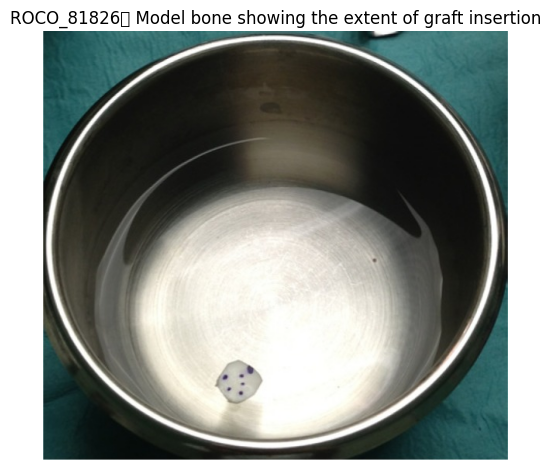

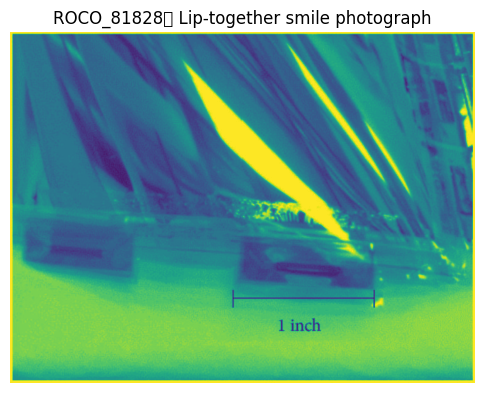

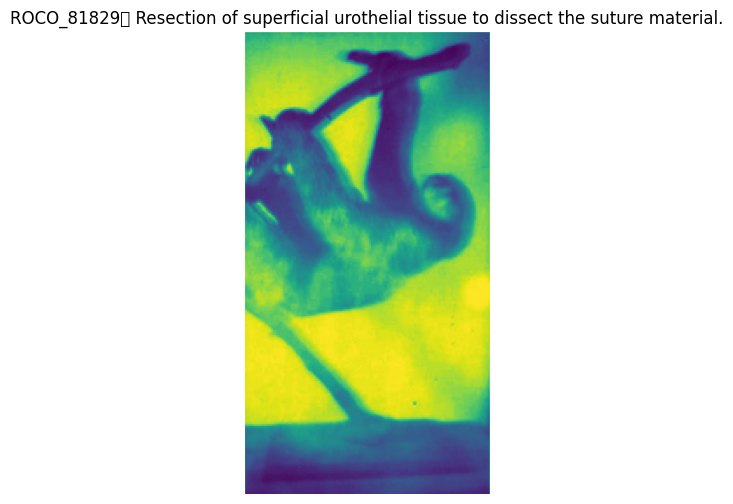

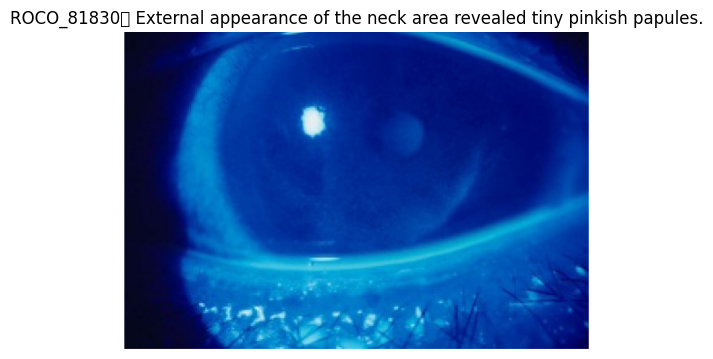

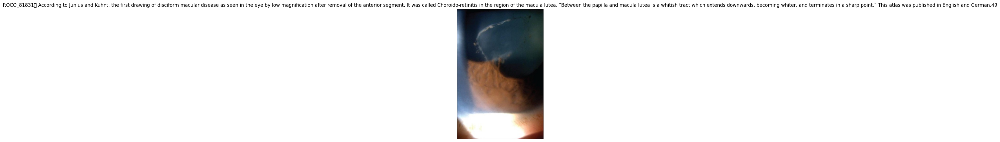

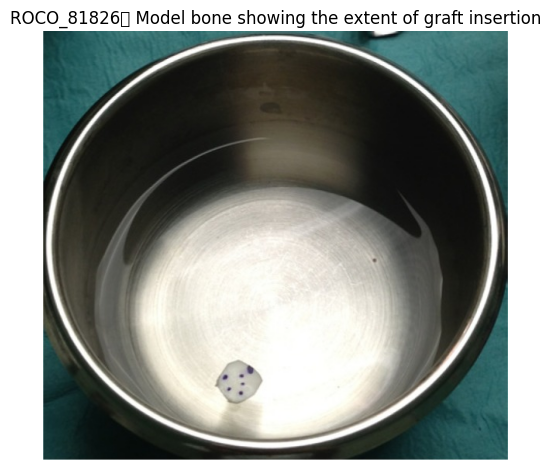

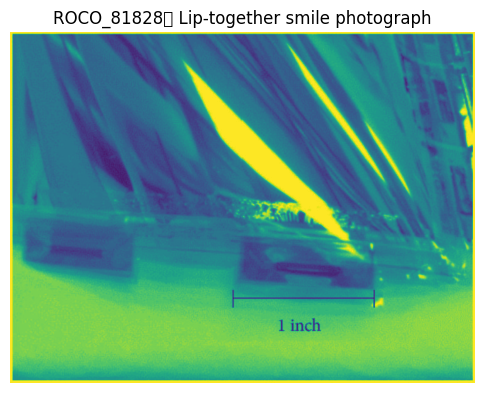

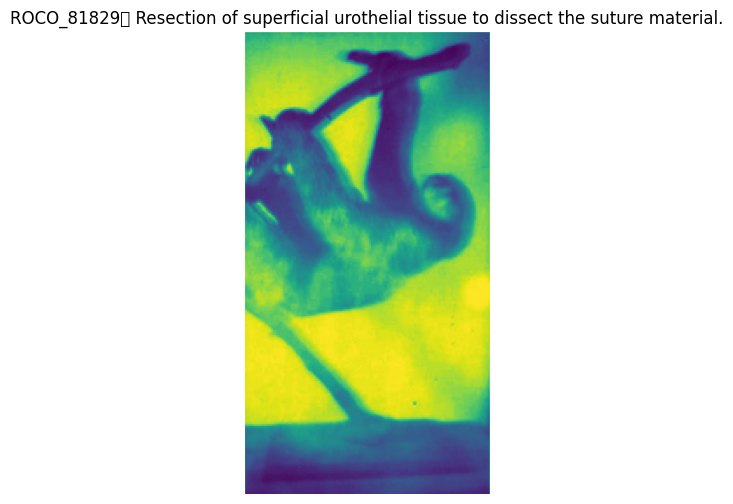

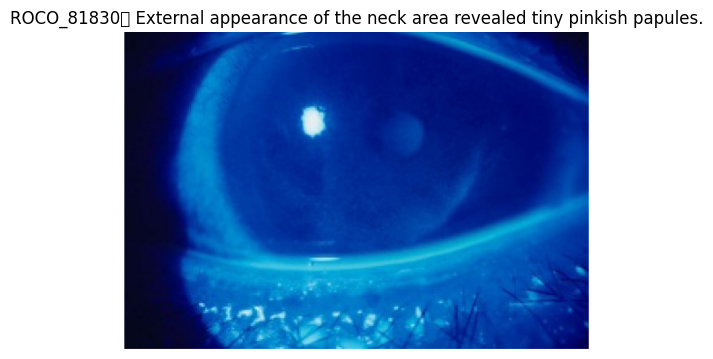

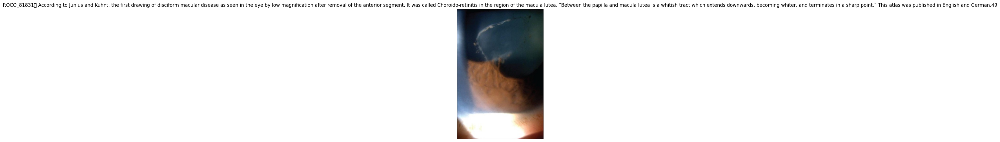

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

image_dir ='/content/drive/MyDrive/ROCO/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'
try:
    # Get a list of valid image file paths in the directory
    image_paths = [
        os.path.join(image_dir, filename)
        for filename in os.listdir(image_dir)
        if filename.lower().endswith(('.jpg', '.png', '.jpeg'))
    ]

    # Check if captions file exists and read captions
    if os.path.exists(captions_file):
        with open(captions_file, 'r', encoding='utf-8') as f:
            captions = [line.strip() for line in f if line.strip()]
    else:
        raise FileNotFoundError(f"Captions file not found at: {captions_file}")

    # Ensure images and captions are aligned
    min_len = min(len(image_paths), len(captions))
    if min_len == 0:
        raise ValueError("No valid image-caption pairs found.")

    image_paths = image_paths[:min_len]
    captions = captions[:min_len]

    # Display images with captions
    for i, (image_path, caption) in enumerate(zip(image_paths, captions)):
        if i >= 5:  # Limit the number of displayed images
            break

        try:
            img = mpimg.imread(image_path)
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(caption, fontsize=12)
            plt.show()
        except Exception as e:
            print(f"Error displaying image {image_path}: {e}")

except Exception as e:
    print(f"An error occurred: {e}")

try:
    # Get a list of valid image file paths in the directory
    image_paths = [
        os.path.join(image_dir, filename)
        for filename in os.listdir(image_dir)
        if filename.lower().endswith(('.jpg', '.png', '.jpeg'))
    ]

    # Check if captions file exists and read captions
    if os.path.exists(captions_file):
        with open(captions_file, 'r', encoding='utf-8') as f:
            captions = [line.strip() for line in f if line.strip()]
    else:
        raise FileNotFoundError(f"Captions file not found at: {captions_file}")

    # Ensure images and captions are aligned
    min_len = min(len(image_paths), len(captions))
    if min_len == 0:
        raise ValueError("No valid image-caption pairs found.")

    image_paths = image_paths[:min_len]
    captions = captions[:min_len]

    # Display images with captions
    for i, (image_path, caption) in enumerate(zip(image_paths, captions)):
        if i >= 5:  # Limit the number of displayed images
            break

        try:
            img = mpimg.imread(image_path)
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(caption, fontsize=12)
            plt.show()
        except Exception as e:
            print(f"Error displaying image {image_path}: {e}")

except Exception as e:
    print(f"An error occurred: {e}")


In [6]:
image_captions = {}
for img, cap in zip(image_paths, captions):
    if img not in image_captions:
        image_captions[img] = []
    image_captions[img].append(cap)

# Print the image paths and their associated captions
for img, caps in image_captions.items():
    print(f"Image: {img}")
    print("Captions:")
    for caption in caps:
        print(f"- {caption}")
    print("-" * 40)

Streaming output truncated to the last 5000 lines.
Image: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_82343.jpg
Captions:
- ROCO_86366	 Fibrous tissue removal at the 12 o’clock position
----------------------------------------
Image: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_82346.jpg
Captions:
- ROCO_86368	 Megaselia parnassia female, labrum.
----------------------------------------
Image: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_82348.jpg
Captions:
- ROCO_86369	 Complete circumferential detachment of the intramural ureter from the bladder wall
----------------------------------------
Image: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_83490.jpg
Captions:
- ROCO_86370	 Acid etching performed for 20 min on 14 and 44
----------------------------------------
Image: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_82356.jpg
Captions:
- ROCO_86371	 BOLD fMRI activation during simultaneou

In [7]:

all_captions = [caption for captions in image_captions.values() for caption in captions]
all_captions[:5]

['ROCO_81826\t Model bone showing the extent of graft insertion',
 'ROCO_81828\t Lip-together smile photograph',
 'ROCO_81829\t Resection of superficial urothelial tissue to dissect the suture material.',
 'ROCO_81830\t External appearance of the neck area revealed tiny pinkish papules.',
 'ROCO_81831\t According to Junius and Kuhnt, the first drawing of disciform macular disease as seen in the eye by low magnification after removal of the anterior segment. It was called Choroido-retinitis in the region of the macula lutea. “Between the papilla and macula lutea is a whitish tract which extends downwards, becoming whiter, and terminates in a sharp point.” This atlas was published in English and German.49']

In [8]:
all_captions = [caption for captions in image_captions.values() for caption in captions]

print("All Captions:")
for i, caption in enumerate(all_captions, 1):
    print(f"{i}. {caption}")

All Captions:
1. ROCO_81826	 Model bone showing the extent of graft insertion
2. ROCO_81828	 Lip-together smile photograph
3. ROCO_81829	 Resection of superficial urothelial tissue to dissect the suture material.
4. ROCO_81830	 External appearance of the neck area revealed tiny pinkish papules.
5. ROCO_81831	 According to Junius and Kuhnt, the first drawing of disciform macular disease as seen in the eye by low magnification after removal of the anterior segment. It was called Choroido-retinitis in the region of the macula lutea. “Between the papilla and macula lutea is a whitish tract which extends downwards, becoming whiter, and terminates in a sharp point.” This atlas was published in English and German.49
6. ROCO_81832	 Significant decrease in size of pneumocephalus (subarachnoid and interventricular) (case 1).
7. ROCO_81833	 A) Gantzer muscle; B) Located posterior to the anterior interosseous nerve; C) Median nerve.
8. ROCO_81836	 Kayser-Fleischer ring.
9. ROCO_81837	 Insertion of

**CAPTION PREPROCESSING AND FEATURE EXTRACTION**

In [9]:
from tensorflow.keras.preprocessing.text import Tokenizer

def preprocess_captions(captions):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(captions)
    sequences = tokenizer.texts_to_sequences(captions)
    max_length = max(len(seq) for seq in sequences)
    vocab_size = len(tokenizer.word_index) + 1
    return tokenizer, sequences, max_length, vocab_size

# Preprocess the captions
tokenizer, sequences, max_length, vocab_size = preprocess_captions(all_captions)

# Print results
print("Preprocessing Results:")
print(f"Vocabulary Size: {vocab_size}")
print(f"Maximum Sequence Length: {max_length}")
print("Sample Sequences (first 5):")
for i, seq in enumerate(sequences[:5], 1):  # Display the first 5 sequences
    print(f"{i}. {seq}")

print("Word Index (first 10 words):")
for word, index in list(tokenizer.word_index.items())[:10]:  # Display the first 10 words in the vocabulary
    print(f"{word}: {index}")

Preprocessing Results:
Vocabulary Size: 22103
Maximum Sequence Length: 409
Sample Sequences (first 5):
1. [3, 8057, 100, 65, 16, 1, 738, 2, 210, 376]
2. [3, 8058, 1297, 1298, 4109, 44]
3. [3, 8059, 805, 2, 953, 8060, 76, 7, 8061, 1, 211, 525]
4. [3, 8062, 237, 275, 2, 1, 310, 36, 564, 8063, 8064, 4110]
5. [3, 8065, 367, 7, 8066, 4, 8067, 1, 99, 496, 2, 5391, 1193, 660, 21, 106, 5, 1, 62, 14, 305, 318, 23, 349, 2, 1, 29, 137, 124, 17, 3299, 8068, 4111, 5, 1, 58, 2, 1, 2355, 5392, 8069, 1, 2095, 4, 2355, 5392, 9, 6, 1130, 565, 53, 1686, 8070, 8071, 8072, 4, 4112, 5, 6, 2356, 91, 1417, 32, 1542, 17, 1299, 5, 4113, 4, 2731, 2732]
Word Index (first 10 words):
the: 1
of: 2
roco: 3
and: 4
in: 5
a: 6
to: 7
with: 8
is: 9
on: 10


In [10]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.models import Model
import random
import os
import tqdm  # For progress bars

# Define the feature extraction function
def extract_features(image_paths, model, batch_size=16):
    features = {}
    for batch_start in tqdm.tqdm(range(0, len(image_paths), batch_size), desc="Processing Batches"):
        batch_paths = image_paths[batch_start:batch_start + batch_size]
        batch_imgs = []
        for path in batch_paths:
            try:
                img = tf.keras.preprocessing.image.load_img(path, target_size=(299, 299))
                img = tf.keras.preprocessing.image.img_to_array(img)
                batch_imgs.append(img)
            except Exception as e:
                print(f"Error loading image {path}: {e}")
                continue

        if not batch_imgs:
            continue

        batch_imgs = np.array(batch_imgs)
        batch_imgs = preprocess_input(batch_imgs)
        batch_features = model.predict(batch_imgs, verbose=0)

        for path, feat in zip(batch_paths, batch_features):
            features[path] = feat
    return features

# Load the pre-trained InceptionV3 model
image_model = InceptionV3(weights="imagenet")
image_model = Model(inputs=image_model.input, outputs=image_model.layers[-2].output)

# Randomly select 10 image paths
random_image_paths = random.sample(image_paths, 10)

# Extract features for the selected random images
image_features = extract_features(random_image_paths, image_model)

# Print feature details for each image
for image_path, features in image_features.items():
    print(f"Image: {os.path.basename(image_path)}")
    print(f"Features Shape: {features.shape}")
    print(f"Features (first 10 values): {features[:10]}")  # Print only first 10 values
    print("-" * 40)


96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Processing Batches: 100%|██████████| 1/1 [00:12<00:00, 12.62s/it]

Image: ROCO_85596.jpg
Features Shape: (2048,)
Features (first 10 values): [0.04340606 0.63791543 0.09219041 0.00855335 0.33078682 0.15868777
 0.0475438  0.44075274 0.04603953 0.24473476]
----------------------------------------
Image: ROCO_82253.jpg
Features Shape: (2048,)
Features (first 10 values): [0.05994723 0.0963483  0.2850631  0.15379895 0.24567592 0.20951056
 0.7632078  0.13121524 0.01367554 0.5073435 ]
----------------------------------------
Image: ROCO_87814.jpg
Features Shape: (2048,)
Features (first 10 values): [0.1246224  0.03895602 0.04847668 0.03869521 0.04890033 0.12974872
 0.56773525 0.0817113  0.01066259 0.0045892 ]
----------------------------------------
Image: ROCO_83093.jpg
Features Shape: (2048,)
Features (first 10 values): [0.64592075 0.13258398 0.19008456 0.710266   0.06565554 0.3399422
 0.08994142 0.20920387 0.37975544 0.42809603]
----------------------------------------
Image: ROCO_81958.jpg
Features Shape: (2048,)
Features (first 10 values): [0.1119303  0.4

**LSTM MODEL FOR CAPTIONING**

In [11]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, Add, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

# Function to create the model
def create_model(vocab_size, max_length):
    # Image Input
    image_input = Input(shape=(2048,), name="image_input")
    image_dense = Dense(256, activation="relu", name="image_dense")(image_input)
    image_dense = BatchNormalization(name="image_batch_norm")(image_dense)
    image_dense = Dropout(0.5, name="image_dropout")(image_dense)

    # Text Input
    text_input = Input(shape=(max_length,), name="text_input")
    text_embedding = Embedding(vocab_size, 256, mask_zero=True, name="text_embedding")(text_input)
    text_lstm = LSTM(256, dropout=0.5, recurrent_dropout=0.5, name="text_lstm")(text_embedding)

    # Decoder
    decoder = Add(name="add_layer")([image_dense, text_lstm])
    decoder_dense = Dense(256, activation="relu", name="decoder_dense")(decoder)
    decoder_dense = Dropout(0.5, name="decoder_dropout")(decoder_dense)
    output = Dense(vocab_size, activation="softmax", name="output")(decoder_dense)

    # Define the model
    model = Model(inputs=[image_input, text_input], outputs=output)

    # Print model summary
    model.summary()

    return model

# Create the model
model = create_model(vocab_size, max_length)

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 2048)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_dense (Dense)       │ (None, 256)            │        524,544 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_input (InputLayer)   │ (None, 409)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_batch_norm          │ (None, 256)            │          1,024 │ image_dense[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_embedding            │ (None, 409, 256)       │      5,658,368 │ text_input[0][0]       │
│ (Embedding)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 409)            │              0 │ text_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_dropout (Dropout)   │ (None, 256)            │              0 │ image_batch_norm[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_lstm (LSTM)          │ (None, 256)            │        525,312 │ text_embedding[0][0],  │
│                           │                        │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_layer (Add)           │ (None, 256)            │              0 │ image_dropout[0][0],   │
│                           │                        │                │ text_lstm[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder_dense (Dense)     │ (None, 256)            │         65,792 │ add_layer[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder_dropout (Dropout) │ (None, 256)            │              0 │ decoder_dense[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (Dense)            │ (None, 22103)          │      5,680,471 │ decoder_dropout[0][0]  │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,455,511 (47.51 MB)

 Trainable params: 12,454,999 (47.51 MB)

 Non-trainable params: 512 (2.00 KB)

In [12]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow as tf

def data_generator(image_features, caption_path, tokenizer, max_length, vocab_size):
    # Load captions from file with utf-8 encoding
    with open(caption_path, 'r', encoding='utf-8') as f:
        captions = [line.strip() for line in f]

    while True:
        for i, (image_id, image_feature) in enumerate(image_features.items()):
            caption = captions[i]  # Match caption by index
            seq = tokenizer.texts_to_sequences([caption])[0]
            for j in range(1, len(seq)):
                input_seq = seq[:j]
                output_word = seq[j]

                # Pad the input sequence
                input_seq_padded = pad_sequences([input_seq], maxlen=max_length, padding='post')[0]

                # Convert to tensors
                image_feature_tensor = tf.convert_to_tensor(image_feature[0], dtype=tf.float32)
                input_seq_tensor = tf.convert_to_tensor(input_seq_padded, dtype=tf.float32)
                output_word_tensor = tf.keras.utils.to_categorical([output_word], num_classes=vocab_size)[0]
                output_word_tensor = tf.convert_to_tensor(output_word_tensor, dtype=tf.float32)

                # Yield the result
                yield (image_feature_tensor, input_seq_tensor), output_word_tensor

# Test the generator with captions file
def test_generator_with_captions():
    # Dummy data for testing
    image_features = {
        "image_1": [tf.random.uniform((2048,))],
        "image_2": [tf.random.uniform((2048,))],
    }
    captions_file_path = '/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'

    tokenizer = tf.keras.preprocessing.text.Tokenizer()
    # Load captions from file for tokenizer fitting with utf-8 encoding
    with open(captions_file_path, 'r', encoding='utf-8') as f:
        all_captions = [line.strip() for line in f]
    tokenizer.fit_on_texts(all_captions)

    max_length = 10
    vocab_size = len(tokenizer.word_index) + 1

    gen = data_generator(image_features, captions_file_path, tokenizer, max_length, vocab_size)

    # Generate and print a few examples
    for _ in range(5):  # Generate 5 samples for demonstration
        (image_feature_tensor, input_seq_tensor), output_word_tensor = next(gen)
        print(f"Image Feature Tensor: {image_feature_tensor.numpy()[:10]}")  # Print first 10 values
        print(f"Input Sequence Tensor: {input_seq_tensor.numpy()}")
        print(f"Output Word Tensor: {output_word_tensor.numpy()}")
        print("-" * 40)

test_generator_with_captions()

Image Feature Tensor: [0.44471467 0.21877193 0.8935894  0.26460433 0.5200629  0.2987975
 0.54820037 0.6811509  0.73992276 0.7828537 ]
Input Sequence Tensor: [3. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Output Word Tensor: [0. 0. 0. ... 0. 0. 0.]
----------------------------------------
Image Feature Tensor: [0.44471467 0.21877193 0.8935894  0.26460433 0.5200629  0.2987975
 0.54820037 0.6811509  0.73992276 0.7828537 ]
Input Sequence Tensor: [3.000e+00 8.068e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00]
Output Word Tensor: [0. 0. 0. ... 0. 0. 0.]
----------------------------------------
Image Feature Tensor: [0.44471467 0.21877193 0.8935894  0.26460433 0.5200629  0.2987975
 0.54820037 0.6811509  0.73992276 0.7828537 ]
Input Sequence Tensor: [3.000e+00 8.068e+03 1.000e+02 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00]
Output Word Tensor: [0. 0. 0. ... 0. 0. 0.]
----------------------------------------
Image Feature Tensor: [0.44471467 0.

**FEATURE EXTRACTION USING DIFFERENT PRETRAINED MODELS**

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 19s 0us/step
574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 19s 0us/step
Processing ResNet50...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Block: conv1_conv
Top 5 feature indices (sorted by mean activation): [26 50 37 29 45]
Top 5 feature mean activations: [24.624155 27.851793 29.08448  29.1753   93.4097  ]


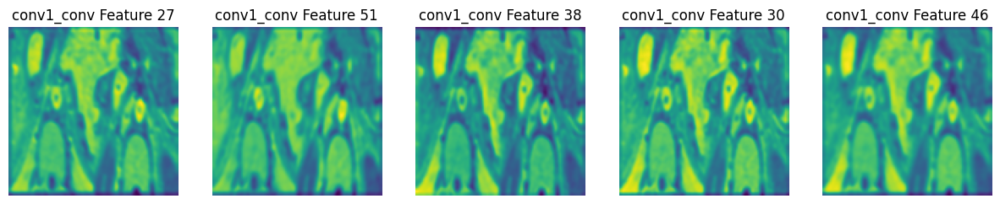

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
Block: conv2_block1_out
Top 5 feature indices (sorted by mean activation): [ 37  33 132  43  36]
Top 5 feature mean activations: [2.5490558 2.5648675 2.6427522 2.660669  3.2278318]


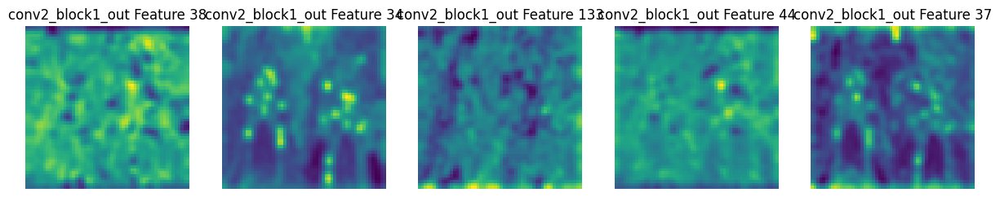

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
Block: conv3_block1_out
Top 5 feature indices (sorted by mean activation): [385  78 493 505 260]
Top 5 feature mean activations: [2.671226  2.7158897 2.7704034 2.8262641 2.9111927]


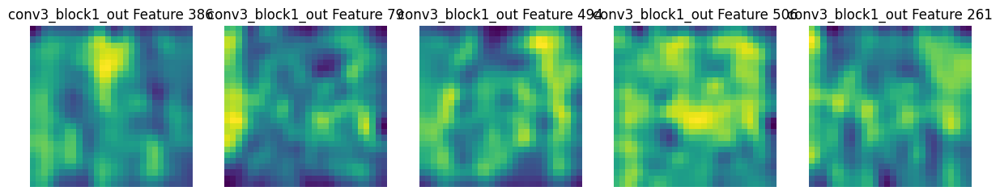

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%
Processing VGG16...


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
Block: block1_conv2
Top 5 feature indices (sorted by mean activation): [45  4 52 27 42]
Top 5 feature mean activations: [169.33817 173.71024 175.33865 182.29752 231.106  ]


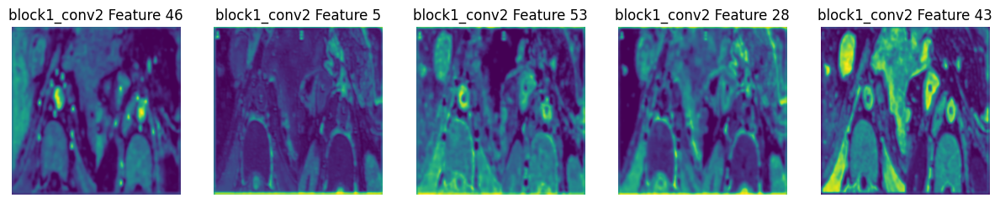

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
Block: block2_conv2
Top 5 feature indices (sorted by mean activation): [ 30  52 125  33 100]
Top 5 feature mean activations: [ 419.79504  430.11227  465.16837  826.1588  1175.0975 ]


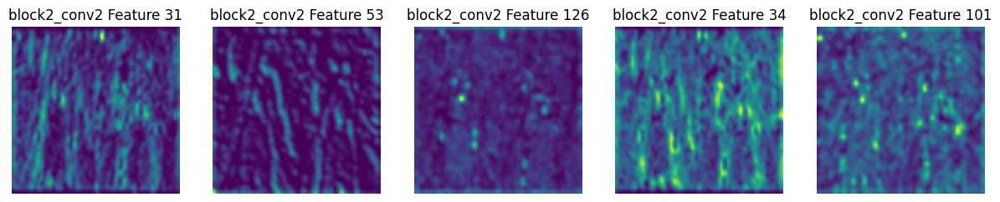

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
Block: block3_conv3
Top 5 feature indices (sorted by mean activation): [ 60 149 147 237 183]
Top 5 feature mean activations: [ 785.6661   810.72455 1064.0052  1082.1157  1147.4181 ]


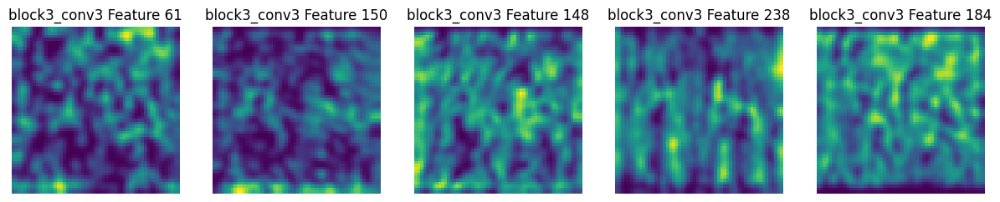

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
Processing VGG19...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
Block: block1_conv2
Top 5 feature indices (sorted by mean activation): [28  2 45 39 42]
Top 5 feature mean activations: [145.55421 159.4719  201.54726 239.26439 288.94083]


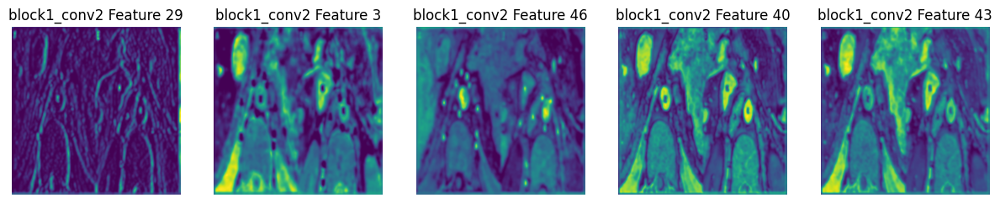

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
Block: block2_conv2
Top 5 feature indices (sorted by mean activation): [ 24 125  30  33 100]
Top 5 feature mean activations: [246.035   250.95308 301.81964 475.77612 604.1782 ]


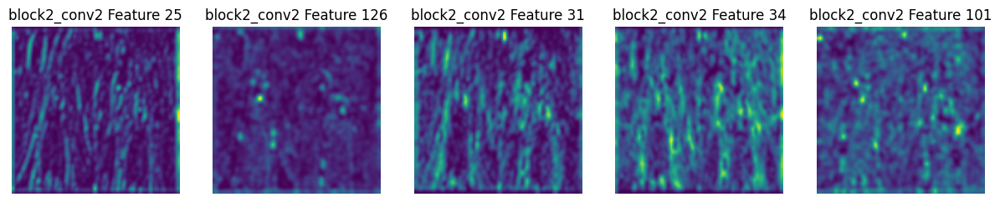

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
Block: block3_conv4
Top 5 feature indices (sorted by mean activation): [152  25 194  63 171]
Top 5 feature mean activations: [1799.0137 1978.7717 2092.003  2108.9067 2234.054 ]


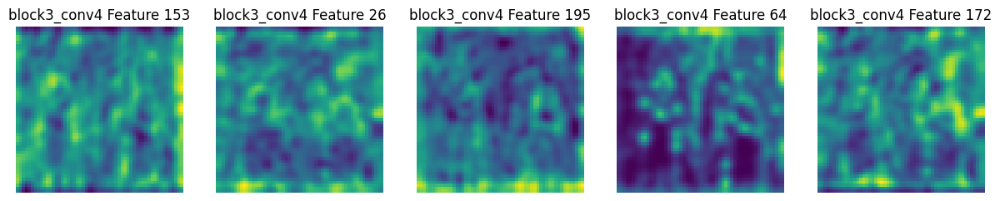

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%


In [13]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, VGG16, VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import cv2

# Load and preprocess the image
def preprocess_image(image_path, model_type):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    if model_type == 'resnet':
        return resnet_preprocess(img_array)
    elif model_type == 'vgg16':
        return vgg16_preprocess(img_array)
    elif model_type == 'vgg19':
        return vgg19_preprocess(img_array)
    return img_array

# Extract features from specific blocks of the model
def extract_block_features(image_path, model, block_name, model_type):
    preprocessed_img = preprocess_image(image_path, model_type)
    intermediate_layer_model = tf.keras.Model(
        inputs=model.input, outputs=model.get_layer(block_name).output
    )
    feature_map = intermediate_layer_model.predict(preprocessed_img)
    return feature_map

# Visualize the top 5 feature maps for a block, print indices, mean activations, and their class names
def visualize_block_features(feature_map, block_name, num_features=5):
    # Normalize the feature map for visualization
    feature_map = feature_map.squeeze()
    feature_map_mean = np.mean(feature_map, axis=(0, 1))
    top_features_idx = np.argsort(feature_map_mean)[-num_features:]

    print(f"Block: {block_name}")
    print("Top 5 feature indices (sorted by mean activation):", top_features_idx)
    print("Top 5 feature mean activations:", feature_map_mean[top_features_idx])

    # Visualize feature maps
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(top_features_idx):
        plt.subplot(1, num_features, i + 1)
        plt.imshow(cv2.GaussianBlur(feature_map[:, :, idx], (5, 5), 0), cmap='viridis')  # Denoise with GaussianBlur
        plt.title(f'{block_name} Feature {idx + 1}')
        plt.axis('off')
    plt.show()

# Get top 5 predicted class names and their probabilities
def get_top_5_predictions(image_path, model, model_type):
    preprocessed_img = preprocess_image(image_path, model_type)
    preds = model.predict(preprocessed_img)
    decoded_preds = decode_predictions(preds, top=5)[0]

    print(f"\nTop 5 Predictions for {model_type}:")
    for i, (imagenet_id, label, prob) in enumerate(decoded_preds):
        print(f"{i+1}. {label}: {prob * 100:.2f}%")

# Load pre-trained models
resnet_model = ResNet50(weights='imagenet', include_top=True)
vgg16_model = VGG16(weights='imagenet', include_top=True)
vgg19_model = VGG19(weights='imagenet', include_top=True)

# Image path
image_path = '/content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_87946.jpg'

# Extract and visualize features for specific blocks
blocks = {
    'resnet': ['conv1_conv', 'conv2_block1_out', 'conv3_block1_out'],
    'vgg16': ['block1_conv2', 'block2_conv2', 'block3_conv3'],
    'vgg19': ['block1_conv2', 'block2_conv2', 'block3_conv4']
}

# ResNet50
print("Processing ResNet50...")
for block in blocks['resnet']:
    resnet_features = extract_block_features(image_path, resnet_model, block, 'resnet')
    visualize_block_features(resnet_features, block)
    get_top_5_predictions(image_path, resnet_model, 'resnet')

# VGG16
print("Processing VGG16...")
for block in blocks['vgg16']:
    vgg16_features = extract_block_features(image_path, vgg16_model, block, 'vgg16')
    visualize_block_features(vgg16_features, block)
    get_top_5_predictions(image_path, vgg16_model, 'vgg16')

# VGG19
print("Processing VGG19...")
for block in blocks['vgg19']:
    vgg19_features = extract_block_features(image_path, vgg19_model, block, 'vgg19')
    visualize_block_features(vgg19_features, block)
    get_top_5_predictions(image_path, vgg19_model, 'vgg19')

**CAPTION GENERATION**

In [3]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os


# Define the file paths
file_path = '/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'

# Load the captions from the file
with open(file_path, 'r') as file:
    all_captions = file.readlines()

# Take the first 10 captions
corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]


image_dir ='/content/drive/MyDrive/ROCO/data/train/non-radiology/images'
captions_file ='/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'


image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith(('.jpg', '.png'))]

# Read the captions from the captions file
with open(captions_file, 'r') as f:
    captions = [line.strip() for line in f]

min_len = min(len(image_paths), len(captions))
image_paths = image_paths[:min_len]
captions = captions[:min_len]



tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

# Create sequences from the corpus
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i + 1]
        sequences.append(ngram_sequence)

# Find the maximum sequence length
max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

# Prepare the features (X) and labels (y)
X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)


# Define hyperparameters
hyperparameters = {
    "embedding_dim": 100,  # Dimension of embedding vector
    "lstm_units": 128,  # Number of LSTM units
    "dropout_rate": 0.3,  # Dropout rate
    "optimizer": 'adam',  # Optimizer type ('adam' or 'rmsprop')
    "learning_rate": 0.001  # Learning rate
}

# Build
def build_model(embedding_dim=50, lstm_units=100, dropout_rate=0.2, optimizer='adam', learning_rate=0.001):

    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    # Build the model
    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len - 1),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=selected_optimizer, metrics=['accuracy'])
    return model


# Build and train the model
model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)


# Train the model
print("\nTraining Model:")
history = model.fit(X, y, epochs=100, verbose=1, batch_size=32)  # Set epochs to 100


def generate_caption(image_caption, max_words=8):
    # Make max_sequence_len accessible inside the function
    global max_sequence_len
    seed_text = image_caption.split()[0]
    generated_text = seed_text
    for _ in range(max_words):
        token_list = tokenizer.texts_to_sequences([generated_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len - 1, padding="pre")
        predicted = np.argmax(model.predict(token_list, verbose=0), axis=-1)
        output_word = next((word for word, index in tokenizer.word_index.items() if index == predicted), None)
        if output_word:
            generated_text += " " + output_word
        if generated_text in corpus:  # Check if generated text is in the corpus
            break  # Stop if the generated text matches a caption in the corpus
    return generated_text



original_caption = captions[5]
generated_caption = generate_caption(original_caption)
print(f"\nOriginal Caption: {original_caption}")
print(f"Generated Caption: {generated_caption}")

Vocabulary size: 187

Training Model:
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.0141 - loss: 5.2285
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - accuracy: 0.0950 - loss: 5.2054
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - accuracy: 0.0908 - loss: 5.0221
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 198ms/step - accuracy: 0.0988 - loss: 4.8715
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.0880 - loss: 4.8543
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.0829 - loss: 4.7737
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.0983 - loss: 4.7226
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - accuracy: 0.0649 - loss: 4.6976
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.0781 - loss: 4.6051
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - accuracy: 0.0656 - loss: 4.6470
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.1010 - loss: 4.4788
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.1053 - lo

**USING LSTM**

In [5]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop

file_path ='/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'

# Load the captions from the file
with open(file_path, 'r') as file:
    all_captions = file.readlines()

# Take the first 10 captions
corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]

# Tokenize the corpus
tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

# Create sequences from the corpus
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

# Find the maximum sequence length
max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

# Prepare the features (X) and labels (y)
X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

# Function to build the model with hyperparameters
def build_model(embedding_dim=50, lstm_units=100, dropout_rate=0.2, optimizer='adam', learning_rate=0.001):
    # Select optimizer with specified learning rate
    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    # Build the model
    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len-1),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=selected_optimizer, metrics=['accuracy'])
    return model

# Define hyperparameters
hyperparameters = {
    "embedding_dim": 100,  # Dimension of embedding vector
    "lstm_units": 128,     # Number of LSTM units
    "dropout_rate": 0.3,   # Dropout rate
    "optimizer": 'adam',   # Optimizer type ('adam' or 'rmsprop')
    "learning_rate": 0.001 # Learning rate
}

# Print the hyperparameters
print("\nHyperparameters:")
for key, value in hyperparameters.items():
    print(f"{key}: {value}")

# Build and train the model
model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)

# Train the model and capture the history
print("\nTraining Model:")
history = model.fit(X, y, epochs=100, verbose=1, batch_size=32)  # Set epochs to 100

# Print the final accuracy
final_accuracy = history.history['accuracy'][-1]  # Get the final accuracy from the history
print(f"\nFinal Accuracy after 100 epochs: {final_accuracy}")

Vocabulary size: 187

Hyperparameters:
embedding_dim: 100
lstm_units: 128
dropout_rate: 0.3
optimizer: adam
learning_rate: 0.001

Training Model:
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.0294 - loss: 5.2311
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.1057 - loss: 5.1996
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.0777 - loss: 5.0410
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.0936 - loss: 4.9968
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - accuracy: 0.0830 - loss: 4.9135
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - accuracy: 0.0913 - loss: 4.8771
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - accuracy: 0.0881 - loss: 4.8357
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - accuracy: 0.0934 - loss: 4.8128
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.0839 - loss: 4.7964
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.0778 - loss: 4.7223
Epo

**HYPERPARAMETER TUNING**

In [9]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.9 MB/s eta 0:00:00


In [10]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
import optuna
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


file_path = '/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'


with open(file_path, 'r') as file:
    all_captions = file.readlines()

# Take first 10 captions
corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]

# Tokenize with limited vocabulary size
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

# Create sequences
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

# Pad sequences
max_sequence_len = max(len(seq) for seq in sequences)
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

# Prepare features and labels
X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the objective function for Optuna
def objective(trial):
    # Define hyperparameter space
    embedding_dim = trial.suggest_categorical("embedding_dim", [50, 100, 150])
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128])
    dropout_rate = trial.suggest_uniform("dropout_rate", 0.2, 0.5)
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "rmsprop"])
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

    # Choose optimizer
    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_name == "rmsprop":
        optimizer = RMSprop(learning_rate=learning_rate)

    # Build the model
    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len-1),
        LSTM(lstm_units),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])

    # Early stopping to prevent overfitting
    early_stopping = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

    # Train the model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=10,  # Reduce epochs for faster tuning
        batch_size=32,
        verbose=0,
        callbacks=[early_stopping]
    )

    # Get final training accuracy (instead of validation accuracy)
    train_accuracy = history.history['accuracy'][-1]
    return train_accuracy

# Run Optuna optimization
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)  # Adjust `n_trials` as needed


print("\nTuned hyperparameters: ")
for key, value in study.best_params.items():
    print(f"{key}: {value}")

print("\nTuned training accuracy: ", study.best_value)

[I 2024-12-25 16:08:33,782] A new study created in memory with name: no-name-1ff6bc9f-96a1-444b-9b61-a669f06a9a6d


Vocabulary size: 187


<ipython-input-10-c0b84b6ad81b>:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform("dropout_rate", 0.2, 0.5)
<ipython-input-10-c0b84b6ad81b>:55: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(
[I 2024-12-25 16:09:04,396] Trial 0 finished with value: 0.20095694065093994 and parameters: {'embedding_dim': 50, 'lstm_units': 128, 'dropout_rate': 0.2758540123847738, 'optimizer': 'adam', 'learning_rate': 0.007376871836491491}. Best


Tuned hyperparameters: 
embedding_dim: 150
lstm_units: 64
dropout_rate: 0.4311071988311489
optimizer: adam
learning_rate: 0.007916018856424747

Tuned training accuracy:  0.43062201142311096


**BLEU SCORE**

In [12]:
!pip install rouge_score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24935 sha256=f607915d60e3a14f5a98231f1a51926349f77b3054f8026f92725df2d6f663d1
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge_score


In [13]:
from nltk.translate.bleu_score import sentence_bleu
from rouge_score import rouge_scorer  # Import rouge_scorer

# Calculate BLEU Score
bleu_score = sentence_bleu([original_caption.split()], generated_caption.split())
print(f"\nBLEU Score: {bleu_score}")

# Calculate ROUGE Score
scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
rouge_score = scorer.score(generated_caption, original_caption)
print(f"ROUGE Score: {rouge_score}")


BLEU Score: 0.3478700554542393
ROUGE Score: {'rouge1': Score(precision=0.7692307692307693, recall=1.0, fmeasure=0.8695652173913044), 'rougeL': Score(precision=0.7692307692307693, recall=1.0, fmeasure=0.8695652173913044)}


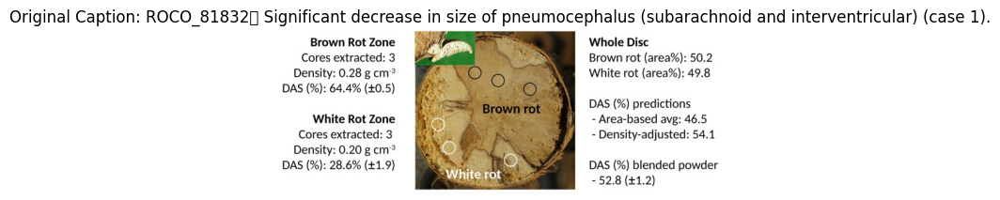

Image Path: /content/drive/MyDrive/ROCO/data/train/non-radiology/images/ROCO_86021.jpg
Original Caption: ROCO_81832	 Significant decrease in size of pneumocephalus (subarachnoid and interventricular) (case 1).


In [33]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os


image_dir = '/content/drive/MyDrive/ROCO/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO/data/train/non-radiology/captions.txt'

# Get a list of image file paths in the directory
image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith(('.jpg', '.png'))]

# Read the captions from the captions file
with open(captions_file, 'r') as f:
    captions = [line.strip() for line in f]

# Ensure both lists have the same length before zipping
min_len = min(len(image_paths), len(captions))
image_paths = image_paths[:min_len]
captions = captions[:min_len]

# Select the first image and its caption
selected_image_path = image_paths[5]  # Select the first image
original_caption = captions[5]  # Select the corresponding caption

# Display the first image and its caption
img = mpimg.imread(selected_image_path)
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.title(f"Original Caption: {original_caption}", fontsize=12)  # Set the title as the caption
plt.show()

print(f"Image Path: {selected_image_path}")
print(f"Original Caption: {original_caption}")

# Tokenize the captions to prepare for training
corpus = captions
tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1

sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")



In [29]:
from nltk.translate.bleu_score import sentence_bleu
from rouge_score import rouge_scorer  # Import rouge_scorer

# Calculate BLEU Score
bleu_score = sentence_bleu([original_caption.split()], generated_caption.split())
print(f"\nBLEU Score: {bleu_score}")

# Calculate ROUGE Score
scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
rouge_score = scorer.score(generated_caption, original_caption)
print(f"ROUGE Score: {rouge_score}")


BLEU Score: 1.3140224370531421e-232
ROUGE Score: {'rouge1': Score(precision=0.045454545454545456, recall=0.14285714285714285, fmeasure=0.06896551724137931), 'rougeL': Score(precision=0.045454545454545456, recall=0.14285714285714285, fmeasure=0.06896551724137931)}
